In [2]:
import os

In [1]:
from urllib.request import urlopen
from json import loads
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.axis import Axis
from matplotlib.pyplot import figure
import matplotlib.colors as clrs

In [3]:
attain = pd.read_excel (r'C:\Users\crathgeb-pc\Desktop\jup_ntb\Education by county.xlsx', header = 4)

In [4]:
attain.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3285 entries, 0 to 3284
Data columns (total 55 columns):
 #   Column                                                                    Non-Null Count  Dtype  
---  ------                                                                    --------------  -----  
 0   Federal Information Processing Standards (FIPS) Code                      3285 non-null   int64  
 1   State                                                                     3285 non-null   object 
 2   Area name                                                                 3285 non-null   object 
 3   2003 Rural-Uban Continuum Code                                            3221 non-null   float64
 4   2003 Urban Influence Code                                                 3221 non-null   float64
 5   2013 Rural-Urban Continuum Code                                           3221 non-null   float64
 6   2013 Urban Influence Code                                       

In [5]:
attain.describe()

,Federal Information Processing Standards (FIPS) Code,2003 Rural-Uban Continuum Code,2003 Urban Influence Code,2013 Rural-Urban Continuum Code,2013 Urban Influence Code,"Less than a high school diploma, 1970","High school diploma only, 1970","Some college (1-3 years), 1970","Four years of college or higher, 1970","Percent of adults with less than a high school diploma, 1970",...,"Percent of adults completing some college or associate's degree, 2007-11",Percent of adults with a bachelor's degree or higher 2007-11,"Less than a high school diploma, 2016-20","High school diploma only, 2016-20","Some college or associate's degree, 2016-20","Bachelor's degree or higher, 2016-20","Percent of adults with less than a high school diploma, 2016-20","Percent of adults with a high school diploma only, 2016-20","Percent of adults completing some college or associate's degree, 2016-20",Percent of adults with a bachelor's degree or higher 2016-20
count,3285.000000,3221.000000,3221.000000,3221.000000,3221.000000,3.186000e+03,3.186000e+03,3.186000e+03,3.186000e+03,3186.000000,...,3274.000000,3274.000000,3.274000e+03,3.274000e+03,3.274000e+03,3.274000e+03,3274.000000,3274.000000,3274.000000,3274.000000
mean,31290.438356,5.057125,5.371624,4.936976,5.187830,4.931574e+04,3.216389e+04,1.097056e+04,1.103321e+04,55.163685,...,7.632364,19.380867,2.374364e+04,5.484798e+04,5.942320e+04,6.759699e+04,12.664914,33.738933,30.824052,22.772101
std,16354.421182,2.701247,3.483776,2.724413,3.506753,9.474535e+05,6.193319e+05,2.120790e+05,2.129546e+05,12.804811,...,2.421802,8.675856,4.612846e+05,1.059061e+06,1.151858e+06,1.312553e+06,6.306428,7.345016,5.476602,9.668894
min,0.000000,1.000000,1.000000,1.000000,1.000000,6.000000e+00,8.000000e+00,0.000000e+00,0.000000e+00,11.800000,...,0.000000,4.244898,3.000000e+00,1.300000e+01,1.600000e+01,0.000000e+00,1.385681,6.524403,5.925926,0.000000
25%,19013.000000,3.000000,2.000000,2.000000,2.000000,3.020250e+03,1.264250e+03,3.760000e+02,2.780000e+02,45.500000,...,5.962214,13.430844,9.597500e+02,2.833750e+03,2.433000e+03,1.322500e+03,7.987456,29.067357,27.271008,16.037552
50%,30015.000000,6.000000,5.000000,6.000000,5.000000,6.031500e+03,2.794500e+03,8.100000e+02,6.100000e+02,53.700000,...,7.516060,17.290064,2.413000e+03,6.560000e+03,5.526000e+03,3.526500e+03,11.269624,34.034199,30.875844,20.438575
75%,46099.000000,7.000000,8.000000,7.000000,8.000000,1.246600e+04,7.169750e+03,2.154750e+03,1.819000e+03,65.700000,...,9.101705,23.023290,5.829000e+03,1.597600e+04,1.524275e+04,1.190125e+04,16.189911,38.986314,34.404498,27.097979
max,72153.000000,9.000000,12.000000,9.000000,12.000000,5.237331e+07,3.415805e+07,1.165073e+07,1.171727e+07,93.000000,...,21.052631,71.957008,2.556268e+07,5.942142e+07,6.449642e+07,7.335632e+07,78.148148,54.963104,81.818184,79.140289


In [6]:
attain.head()

,Federal Information Processing Standards (FIPS) Code,State,Area name,2003 Rural-Uban Continuum Code,2003 Urban Influence Code,2013 Rural-Urban Continuum Code,2013 Urban Influence Code,"Less than a high school diploma, 1970","High school diploma only, 1970","Some college (1-3 years), 1970",...,"Percent of adults completing some college or associate's degree, 2007-11",Percent of adults with a bachelor's degree or higher 2007-11,"Less than a high school diploma, 2016-20","High school diploma only, 2016-20","Some college or associate's degree, 2016-20","Bachelor's degree or higher, 2016-20","Percent of adults with less than a high school diploma, 2016-20","Percent of adults with a high school diploma only, 2016-20","Percent of adults completing some college or associate's degree, 2016-20",Percent of adults with a bachelor's degree or higher 2016-20
0,0,US,United States,NaN,NaN,NaN,NaN,52373312.0,34158051.0,11650730.0,...,7.594254,28.198044,25562680.0,59421420.0,64496416.0,73356320.0,11.471478,26.665888,28.943336,32.919296
1,1000,AL,Alabama,NaN,NaN,NaN,NaN,1062306.0,468269.0,136287.0,...,7.010820,21.970104,438947.0,1014342.0,1013673.0,877044.0,13.126382,30.333139,30.313133,26.227345
2,1001,AL,Autauga County,2.0,2.0,2.0,2.0,6611.0,3757.0,933.0,...,7.567739,21.624592,4273.0,11880.0,10986.0,10721.0,11.286318,31.378763,29.017433,28.317486
3,1003,AL,Baldwin County,4.0,5.0,3.0,2.0,18726.0,8426.0,2334.0,...,7.932503,27.214945,14823.0,42272.0,48832.0,49636.0,9.528615,27.173557,31.390497,31.907330
4,1005,AL,Barbour County,6.0,6.0,6.0,6.0,8120.0,2242.0,581.0,...,6.563095,13.897696,4497.0,6361.0,4872.0,2067.0,25.268303,35.741978,27.375401,11.614317


State  
Area name  
Less than a high school diploma, 1970  
High school diploma only, 1970  
Some college (1-3 years), 1970  
Percent of adults completing some college or associate's degree, 2007-11  
Percent of adults with a bachelor's degree or higher 2007-11  
Percent of adults with less than a high school diploma, 2016-20  
Percent of adults with a high school diploma only, 2016-20  
Percent of adults completing some college or associate's degree, 2016-20  
Percent of adults with a bachelor's degree or higher 2016-20  

In [8]:
attain_2 = attain.drop(['Federal Information Processing Standards (FIPS) Code', '2003 Rural-Uban Continuum Code', '2003 Urban Influence Code', '2013 Rural-Urban Continuum Code', '2013 Urban Influence Code'], axis=1)

In [9]:
attain_2.head()

,State,Area name,"Less than a high school diploma, 1970","High school diploma only, 1970","Some college (1-3 years), 1970","Four years of college or higher, 1970","Percent of adults with less than a high school diploma, 1970","Percent of adults with a high school diploma only, 1970","Percent of adults completing some college (1-3 years), 1970","Percent of adults completing four years of college or higher, 1970",...,"Percent of adults completing some college or associate's degree, 2007-11",Percent of adults with a bachelor's degree or higher 2007-11,"Less than a high school diploma, 2016-20","High school diploma only, 2016-20","Some college or associate's degree, 2016-20","Bachelor's degree or higher, 2016-20","Percent of adults with less than a high school diploma, 2016-20","Percent of adults with a high school diploma only, 2016-20","Percent of adults completing some college or associate's degree, 2016-20",Percent of adults with a bachelor's degree or higher 2016-20
0,US,United States,52373312.0,34158051.0,11650730.0,11717266.0,47.7,31.1,10.6,10.7,...,7.594254,28.198044,25562680.0,59421420.0,64496416.0,73356320.0,11.471478,26.665888,28.943336,32.919296
1,AL,Alabama,1062306.0,468269.0,136287.0,141936.0,58.7,25.9,7.5,7.8,...,7.010820,21.970104,438947.0,1014342.0,1013673.0,877044.0,13.126382,30.333139,30.313133,26.227345
2,AL,Autauga County,6611.0,3757.0,933.0,767.0,54.8,31.1,7.7,6.4,...,7.567739,21.624592,4273.0,11880.0,10986.0,10721.0,11.286318,31.378763,29.017433,28.317486
3,AL,Baldwin County,18726.0,8426.0,2334.0,2038.0,59.4,26.7,7.4,6.5,...,7.932503,27.214945,14823.0,42272.0,48832.0,49636.0,9.528615,27.173557,31.390497,31.907330
4,AL,Barbour County,8120.0,2242.0,581.0,861.0,68.8,19.0,4.9,7.3,...,6.563095,13.897696,4497.0,6361.0,4872.0,2067.0,25.268303,35.741978,27.375401,11.614317


In [10]:
attain_2.groupby('State')

In [11]:
attain_2.head()

,State,Area name,"Less than a high school diploma, 1970","High school diploma only, 1970","Some college (1-3 years), 1970","Four years of college or higher, 1970","Percent of adults with less than a high school diploma, 1970","Percent of adults with a high school diploma only, 1970","Percent of adults completing some college (1-3 years), 1970","Percent of adults completing four years of college or higher, 1970",...,"Percent of adults completing some college or associate's degree, 2007-11",Percent of adults with a bachelor's degree or higher 2007-11,"Less than a high school diploma, 2016-20","High school diploma only, 2016-20","Some college or associate's degree, 2016-20","Bachelor's degree or higher, 2016-20","Percent of adults with less than a high school diploma, 2016-20","Percent of adults with a high school diploma only, 2016-20","Percent of adults completing some college or associate's degree, 2016-20",Percent of adults with a bachelor's degree or higher 2016-20
0,US,United States,52373312.0,34158051.0,11650730.0,11717266.0,47.7,31.1,10.6,10.7,...,7.594254,28.198044,25562680.0,59421420.0,64496416.0,73356320.0,11.471478,26.665888,28.943336,32.919296
1,AL,Alabama,1062306.0,468269.0,136287.0,141936.0,58.7,25.9,7.5,7.8,...,7.010820,21.970104,438947.0,1014342.0,1013673.0,877044.0,13.126382,30.333139,30.313133,26.227345
2,AL,Autauga County,6611.0,3757.0,933.0,767.0,54.8,31.1,7.7,6.4,...,7.567739,21.624592,4273.0,11880.0,10986.0,10721.0,11.286318,31.378763,29.017433,28.317486
3,AL,Baldwin County,18726.0,8426.0,2334.0,2038.0,59.4,26.7,7.4,6.5,...,7.932503,27.214945,14823.0,42272.0,48832.0,49636.0,9.528615,27.173557,31.390497,31.907330
4,AL,Barbour County,8120.0,2242.0,581.0,861.0,68.8,19.0,4.9,7.3,...,6.563095,13.897696,4497.0,6361.0,4872.0,2067.0,25.268303,35.741978,27.375401,11.614317


In [15]:
a = ['TX', 'PA', 'FL', 'OK', 'KS', 'IN', 'VA', 'TN', 'MO', 'GA', 'NY', 'UT', 'NC', 'WS', 'WA', 'IL', 'IO', 'OH', 'NJ', 'MI']
    
att = attain_2[attain_2['State'].isin(a)]

In [16]:
pd.set_option('display.max_rows', None)

In [17]:
print(att)

     State              Area name  Less than a high school diploma, 1970  \
339     FL                Florida                              1882537.0   
340     FL         Alachua County                                18825.0   
341     FL           Baker County                                 3119.0   
342     FL             Bay County                                18967.0   
343     FL        Bradford County                                 4977.0   
344     FL         Brevard County                                34845.0   
345     FL         Broward County                               175532.0   
346     FL         Calhoun County                                 2864.0   
347     FL       Charlotte County                                 9946.0   
348     FL          Citrus County                                 7646.0   
349     FL            Clay County                                 7546.0   
350     FL         Collier County                                 9668.0   
351     FL  

In [20]:
dis_count = pd.read_excel (r'C:\Users\crathgeb-pc\Desktop\jup_ntb\sdlist-20.xls', header = 2)

In [21]:
dis_count.head()

,State Postal Code,State FIPS,District ID Number,School District Name,County Names,County FIPS
0,AL,1,190,Alabaster City School District,Shelby County,117
1,AL,1,5,Albertville City School District,Marshall County,95
2,AL,1,30,Alexander City City School District,Tallapoosa County,123
3,AL,1,60,Andalusia City School District,Covington County,39
4,AL,1,90,Anniston City School District,Calhoun County,15


In [31]:
dc = dis_count.rename(columns = {'State Postal Code' : 'State', 'County Names' : 'County'}, inplace = True)
at = att.rename(columns = {'Area name' : 'County'}, inplace = True)

In [36]:
dis_count

,State,State FIPS,District ID Number,School District Name,County,County FIPS
0,AL,1,190,Alabaster City School District,Shelby County,117
1,AL,1,5,Albertville City School District,Marshall County,95
2,AL,1,30,Alexander City City School District,Tallapoosa County,123
3,AL,1,60,Andalusia City School District,Covington County,39
4,AL,1,90,Anniston City School District,Calhoun County,15
5,AL,1,100,Arab City School District,Cullman County,43
6,AL,1,100,Arab City School District,Marshall County,95
7,AL,1,120,Athens City School District,Limestone County,83
8,AL,1,180,Attalla City School District,Etowah County,55
9,AL,1,210,Auburn City School District,Lee County,81


In [37]:
attainment = pd.merge(att, dis_count, how='outer', on=['State', 'County'])

In [38]:
attainment.head()

,State,County,"Less than a high school diploma, 1970","High school diploma only, 1970","Some college (1-3 years), 1970","Four years of college or higher, 1970","Percent of adults with less than a high school diploma, 1970","Percent of adults with a high school diploma only, 1970","Percent of adults completing some college (1-3 years), 1970","Percent of adults completing four years of college or higher, 1970",...,"Some college or associate's degree, 2016-20","Bachelor's degree or higher, 2016-20","Percent of adults with less than a high school diploma, 2016-20","Percent of adults with a high school diploma only, 2016-20","Percent of adults completing some college or associate's degree, 2016-20",Percent of adults with a bachelor's degree or higher 2016-20,State FIPS,District ID Number,School District Name,County FIPS
0,FL,Florida,1882537.0,1219216.0,458864.0,407264.0,47.4,30.7,11.6,10.3,...,4535040.0,4659946.0,11.483190,28.242870,29.727585,30.546354,NaN,NaN,NaN,NaN
1,FL,Alachua County,18825.0,11494.0,5726.0,10816.0,40.2,24.5,12.2,23.1,...,46787.0,72456.0,7.211609,20.238501,28.466171,44.083717,12.0,30.0,Alachua County School District,1.0
2,FL,Baker County,3119.0,1271.0,228.0,173.0,65.1,26.5,4.8,3.6,...,5569.0,2779.0,15.075429,41.795826,28.771441,14.357306,12.0,60.0,Baker County School District,3.0
3,FL,Bay County,18967.0,12186.0,3945.0,3575.0,49.0,31.5,10.2,9.2,...,47259.0,31305.0,9.059340,29.493887,36.962387,24.484385,12.0,90.0,Bay County School District,5.0
4,FL,Bradford County,4977.0,2015.0,496.0,349.0,63.5,25.7,6.3,4.5,...,5504.0,2083.0,21.060942,41.500122,27.160128,10.278806,12.0,120.0,Bradford County School District,7.0


In [40]:
att = attainment.drop(['State FIPS', 'District ID Number', 'County FIPS'], axis = 1)

In [41]:
att.head()

,State,County,"Less than a high school diploma, 1970","High school diploma only, 1970","Some college (1-3 years), 1970","Four years of college or higher, 1970","Percent of adults with less than a high school diploma, 1970","Percent of adults with a high school diploma only, 1970","Percent of adults completing some college (1-3 years), 1970","Percent of adults completing four years of college or higher, 1970",...,Percent of adults with a bachelor's degree or higher 2007-11,"Less than a high school diploma, 2016-20","High school diploma only, 2016-20","Some college or associate's degree, 2016-20","Bachelor's degree or higher, 2016-20","Percent of adults with less than a high school diploma, 2016-20","Percent of adults with a high school diploma only, 2016-20","Percent of adults completing some college or associate's degree, 2016-20",Percent of adults with a bachelor's degree or higher 2016-20,School District Name
0,FL,Florida,1882537.0,1219216.0,458864.0,407264.0,47.4,30.7,11.6,10.3,...,25.996693,1751798.0,4308542.0,4535040.0,4659946.0,11.483190,28.242870,29.727585,30.546354,NaN
1,FL,Alachua County,18825.0,11494.0,5726.0,10816.0,40.2,24.5,12.2,23.1,...,41.130100,11853.0,33264.0,46787.0,72456.0,7.211609,20.238501,28.466171,44.083717,Alachua County School District
2,FL,Baker County,3119.0,1271.0,228.0,173.0,65.1,26.5,4.8,3.6,...,7.434053,2918.0,8090.0,5569.0,2779.0,15.075429,41.795826,28.771441,14.357306,Baker County School District
3,FL,Bay County,18967.0,12186.0,3945.0,3575.0,49.0,31.5,10.2,9.2,...,20.963404,11583.0,37710.0,47259.0,31305.0,9.059340,29.493887,36.962387,24.484385,Bay County School District
4,FL,Bradford County,4977.0,2015.0,496.0,349.0,63.5,25.7,6.3,4.5,...,8.817448,4268.0,8410.0,5504.0,2083.0,21.060942,41.500122,27.160128,10.278806,Bradford County School District


In [42]:
att.rename(columns = {'School District Name' : 'School District'}, inplace = True)

In [45]:
att_1970 = att[['State', 'County', 'School District', 'Percent of adults with less than a high school diploma, 1970', 'Percent of adults with a high school diploma only, 1970', 'Percent of adults completing some college (1-3 years), 1970', 'Percent of adults completing four years of college or higher, 1970']].copy()

In [46]:
att_1970.head()

,State,County,School District,"Percent of adults with less than a high school diploma, 1970","Percent of adults with a high school diploma only, 1970","Percent of adults completing some college (1-3 years), 1970","Percent of adults completing four years of college or higher, 1970"
0,FL,Florida,NaN,47.4,30.7,11.6,10.3
1,FL,Alachua County,Alachua County School District,40.2,24.5,12.2,23.1
2,FL,Baker County,Baker County School District,65.1,26.5,4.8,3.6
3,FL,Bay County,Bay County School District,49.0,31.5,10.2,9.2
4,FL,Bradford County,Bradford County School District,63.5,25.7,6.3,4.5


In [47]:
filter_col = [col for col in att if col.startswith('Percent')]

In [48]:
att_1980 = att[['State', 'County', 'School District', 'Percent of adults with less than a high school diploma, 1980', 'Percent of adults with a high school diploma only, 1980', 'Percent of adults completing some college (1-3 years), 1980', 'Percent of adults completing four years of college or higher, 1980']].copy()

In [51]:
att_1990 = att[['State', 'County', 'School District', 'Percent of adults with less than a high school diploma, 1990', 'Percent of adults with a high school diploma only, 1990', "Percent of adults completing some college or associate's degree, 1990", "Percent of adults with a bachelor's degree or higher, 1990"]].copy()

In [52]:
att_2000 = att[['State', 'County', 'School District', 'Percent of adults with less than a high school diploma, 2000', 'Percent of adults with a high school diploma only, 2000', "Percent of adults completing some college or associate's degree, 2000", "Percent of adults with a bachelor's degree or higher, 2000"]].copy()

In [54]:
att_2007_11 = att[['State', 'County', 'School District', 'Percent of adults with less than a high school diploma, 2007-11', 'Percent of adults with a high school diploma only, 2007-11', "Percent of adults completing some college or associate's degree, 2007-11", "Percent of adults with a bachelor's degree or higher 2007-11"]].copy()

In [55]:
att_2016_20 = att[['State', 'County', 'School District', 'Percent of adults with less than a high school diploma, 2016-20', 'Percent of adults with a high school diploma only, 2016-20', "Percent of adults completing some college or associate's degree, 2016-20", "Percent of adults with a bachelor's degree or higher 2016-20"]].copy()

In [68]:
att_1970['Year'] = '1970'

In [70]:
att_1980['Year'] = '1980'

In [71]:
att_1990['Year'] = '1990'

In [72]:
att_2000['Year'] = '2000'

In [73]:
att_2007_11['Year'] = '2007-11'

In [74]:
att_2016_20['Year'] = '2016-20'

In [64]:
simplified = att[['State', 'County', 'School District']].copy()

In [60]:
percent.head()

,"Percent of adults with less than a high school diploma, 1970","Percent of adults with a high school diploma only, 1970","Percent of adults completing some college (1-3 years), 1970","Percent of adults completing four years of college or higher, 1970","Percent of adults with less than a high school diploma, 1980","Percent of adults with a high school diploma only, 1980","Percent of adults completing some college (1-3 years), 1980","Percent of adults completing four years of college or higher, 1980","Percent of adults with less than a high school diploma, 1990","Percent of adults with a high school diploma only, 1990",...,"Percent of adults completing some college or associate's degree, 2000","Percent of adults with a bachelor's degree or higher, 2000","Percent of adults with less than a high school diploma, 2007-11","Percent of adults with a high school diploma only, 2007-11","Percent of adults completing some college or associate's degree, 2007-11",Percent of adults with a bachelor's degree or higher 2007-11,"Percent of adults with less than a high school diploma, 2016-20","Percent of adults with a high school diploma only, 2016-20","Percent of adults completing some college or associate's degree, 2016-20",Percent of adults with a bachelor's degree or higher 2016-20
0,47.4,30.7,11.6,10.3,33.3,35.0,16.8,14.9,25.6,30.1,...,28.8,22.3,14.453671,50.961834,8.587802,25.996693,11.483190,28.242870,29.727585,30.546354
1,40.2,24.5,12.2,23.1,24.5,26.3,19.8,29.4,17.3,21.7,...,29.1,38.7,9.746253,38.356087,10.767557,41.130100,7.211609,20.238501,28.466171,44.083717
2,65.1,26.5,4.8,3.6,49.3,35.3,9.7,5.7,35.9,37.4,...,22.3,8.2,21.588583,64.678017,6.299351,7.434053,15.075429,41.795826,28.771441,14.357306
3,49.0,31.5,10.2,9.2,34.2,35.7,16.9,13.2,25.3,30.6,...,32.7,17.7,12.930387,56.671326,9.434885,20.963404,9.059340,29.493887,36.962387,24.484385
4,63.5,25.7,6.3,4.5,46.4,33.7,12.3,7.6,35.0,36.8,...,25.6,8.4,25.600630,58.832218,6.749705,8.817448,21.060942,41.500122,27.160128,10.278806


In [65]:
att_new = simplified.join(percent)

In [66]:
att_new.head()

,State,County,School District,"Percent of adults with less than a high school diploma, 1970","Percent of adults with a high school diploma only, 1970","Percent of adults completing some college (1-3 years), 1970","Percent of adults completing four years of college or higher, 1970","Percent of adults with less than a high school diploma, 1980","Percent of adults with a high school diploma only, 1980","Percent of adults completing some college (1-3 years), 1980",...,"Percent of adults completing some college or associate's degree, 2000","Percent of adults with a bachelor's degree or higher, 2000","Percent of adults with less than a high school diploma, 2007-11","Percent of adults with a high school diploma only, 2007-11","Percent of adults completing some college or associate's degree, 2007-11",Percent of adults with a bachelor's degree or higher 2007-11,"Percent of adults with less than a high school diploma, 2016-20","Percent of adults with a high school diploma only, 2016-20","Percent of adults completing some college or associate's degree, 2016-20",Percent of adults with a bachelor's degree or higher 2016-20
0,FL,Florida,NaN,47.4,30.7,11.6,10.3,33.3,35.0,16.8,...,28.8,22.3,14.453671,50.961834,8.587802,25.996693,11.483190,28.242870,29.727585,30.546354
1,FL,Alachua County,Alachua County School District,40.2,24.5,12.2,23.1,24.5,26.3,19.8,...,29.1,38.7,9.746253,38.356087,10.767557,41.130100,7.211609,20.238501,28.466171,44.083717
2,FL,Baker County,Baker County School District,65.1,26.5,4.8,3.6,49.3,35.3,9.7,...,22.3,8.2,21.588583,64.678017,6.299351,7.434053,15.075429,41.795826,28.771441,14.357306
3,FL,Bay County,Bay County School District,49.0,31.5,10.2,9.2,34.2,35.7,16.9,...,32.7,17.7,12.930387,56.671326,9.434885,20.963404,9.059340,29.493887,36.962387,24.484385
4,FL,Bradford County,Bradford County School District,63.5,25.7,6.3,4.5,46.4,33.7,12.3,...,25.6,8.4,25.600630,58.832218,6.749705,8.817448,21.060942,41.500122,27.160128,10.278806


In [67]:
att_new.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 19030 entries, 0 to 19029
Data columns (total 27 columns):
 #   Column                                                                    Non-Null Count  Dtype  
---  ------                                                                    --------------  -----  
 0   State                                                                     19030 non-null  object 
 1   County                                                                    19030 non-null  object 
 2   School District                                                           19009 non-null  object 
 3   Percent of adults with less than a high school diploma, 1970              10656 non-null  float64
 4   Percent of adults with a high school diploma only, 1970                   10656 non-null  float64
 5   Percent of adults completing some college (1-3 years), 1970               10656 non-null  float64
 6   Percent of adults completing four years of college or higher, 

In [87]:
new = pd.merge(att_1970, att_1980, how='outer', on=['State', 'County', 'School District', 'Year'])

In [89]:
new2 = pd.merge(new, att_1990, how='outer', on=['State', 'County', 'School District', 'Year'])

In [90]:
new3 = pd.merge(new2, att_2000, how='outer', on=['State', 'County', 'School District', 'Year'])

In [91]:
new4 = pd.merge(new3, att_2007_11, how='outer', on=['State', 'County', 'School District', 'Year'])

In [92]:
new5 = pd.merge(new4, att_2016_20, how='outer', on=['State', 'County', 'School District', 'Year'])

In [93]:
new5.head()

,State,County,School District,"Percent of adults with less than a high school diploma, 1970","Percent of adults with a high school diploma only, 1970","Percent of adults completing some college (1-3 years), 1970","Percent of adults completing four years of college or higher, 1970",Year,"Percent of adults with less than a high school diploma, 1980","Percent of adults with a high school diploma only, 1980",...,"Percent of adults completing some college or associate's degree, 2000","Percent of adults with a bachelor's degree or higher, 2000","Percent of adults with less than a high school diploma, 2007-11","Percent of adults with a high school diploma only, 2007-11","Percent of adults completing some college or associate's degree, 2007-11",Percent of adults with a bachelor's degree or higher 2007-11,"Percent of adults with less than a high school diploma, 2016-20","Percent of adults with a high school diploma only, 2016-20","Percent of adults completing some college or associate's degree, 2016-20",Percent of adults with a bachelor's degree or higher 2016-20
0,FL,Florida,NaN,47.4,30.7,11.6,10.3,1970,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,FL,Alachua County,Alachua County School District,40.2,24.5,12.2,23.1,1970,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,FL,Baker County,Baker County School District,65.1,26.5,4.8,3.6,1970,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,FL,Bay County,Bay County School District,49.0,31.5,10.2,9.2,1970,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,FL,Bradford County,Bradford County School District,63.5,25.7,6.3,4.5,1970,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [94]:
new5.groupby('Year')

In [96]:
new5.head()

,State,County,School District,"Percent of adults with less than a high school diploma, 1970","Percent of adults with a high school diploma only, 1970","Percent of adults completing some college (1-3 years), 1970","Percent of adults completing four years of college or higher, 1970",Year,"Percent of adults with less than a high school diploma, 1980","Percent of adults with a high school diploma only, 1980",...,"Percent of adults completing some college or associate's degree, 2000","Percent of adults with a bachelor's degree or higher, 2000","Percent of adults with less than a high school diploma, 2007-11","Percent of adults with a high school diploma only, 2007-11","Percent of adults completing some college or associate's degree, 2007-11",Percent of adults with a bachelor's degree or higher 2007-11,"Percent of adults with less than a high school diploma, 2016-20","Percent of adults with a high school diploma only, 2016-20","Percent of adults completing some college or associate's degree, 2016-20",Percent of adults with a bachelor's degree or higher 2016-20
0,FL,Florida,NaN,47.4,30.7,11.6,10.3,1970,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,FL,Alachua County,Alachua County School District,40.2,24.5,12.2,23.1,1970,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,FL,Baker County,Baker County School District,65.1,26.5,4.8,3.6,1970,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,FL,Bay County,Bay County School District,49.0,31.5,10.2,9.2,1970,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,FL,Bradford County,Bradford County School District,63.5,25.7,6.3,4.5,1970,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [119]:
new5.head()

,County,School District,"Percent of adults with less than a high school diploma, 1970","Percent of adults with a high school diploma only, 1970","Percent of adults completing some college (1-3 years), 1970","Percent of adults completing four years of college or higher, 1970",Year,"Percent of adults with less than a high school diploma, 1980","Percent of adults with a high school diploma only, 1980","Percent of adults completing some college (1-3 years), 1980",...,"Percent of adults completing some college or associate's degree, 2000","Percent of adults with a bachelor's degree or higher, 2000","Percent of adults with less than a high school diploma, 2007-11","Percent of adults with a high school diploma only, 2007-11","Percent of adults completing some college or associate's degree, 2007-11",Percent of adults with a bachelor's degree or higher 2007-11,"Percent of adults with less than a high school diploma, 2016-20","Percent of adults with a high school diploma only, 2016-20","Percent of adults completing some college or associate's degree, 2016-20",Percent of adults with a bachelor's degree or higher 2016-20
State,,,,,,,,,,,,,,,,,,,,,
FL,Florida,NaN,47.4,30.7,11.6,10.3,1970,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
FL,Alachua County,Alachua County School District,40.2,24.5,12.2,23.1,1970,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
FL,Baker County,Baker County School District,65.1,26.5,4.8,3.6,1970,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
FL,Bay County,Bay County School District,49.0,31.5,10.2,9.2,1970,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
FL,Bradford County,Bradford County School District,63.5,25.7,6.3,4.5,1970,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


ValueError: Could not interpret input 'Percent of adults with less than a high school diploma, 1970'

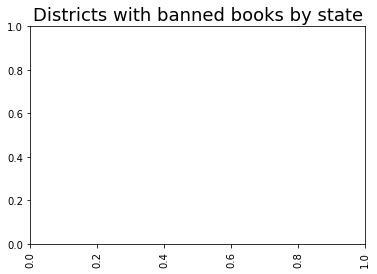

In [150]:
counts = att_1970.groupby(['State', 'School District']).size()
counts = counts.to_frame('counts').reset_index()
g8 = plt.title('Districts with banned books by state', size = 18)
g8 = plt.xticks(rotation=90)

g8 = sns.catplot(data = counts, x = "School District", y = "Percent of adults with less than a high school diploma, 1970", hue = "counts")

plt.show()

ValueError: The number of FixedLocator locations (51), usually from a call to set_ticks, does not match the number of ticklabels (19030).

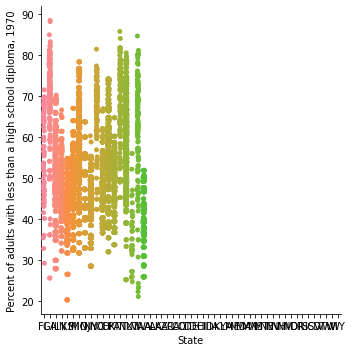

In [135]:
g = sns.catplot(x = 'State', y = 'Percent of adults with less than a high school diploma, 1970', data = att_1970)
_ = g.set_xticklabels(labels = att_1970['State'], rotation = 90)
